# **Pepper Bell Disease Classification**

Dataset used: https://www.kaggle.com/datasets/arjuntejaswi/plant-village

### **Loading the module and datas**

In [1]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import cv2


In [ ]:
#constants
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 100
FILE_PATH="workspace"

In [3]:
#copying only the necessary datasets . doing only Pepper bell
!mkdir "workspace"

!cp -r "../input/pepper-anth/anthracnose/" "/kaggle/working/workspace"
!cp -r "../input/pepper-anth/healthy" "/kaggle/working/workspace"


In [4]:
!mkdir "test"
!cp -r "../input/fruit-test/anthracnose" "/kaggle/working/test"
!cp -r "../input/fruit-test/healthy" "/kaggle/working/test"


In [8]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
            directory=FILE_PATH,
            shuffle=True,
            image_size=(IMAGE_SIZE,IMAGE_SIZE),
            batch_size = BATCH_SIZE,
)
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
            directory="test",
            shuffle=True,
            image_size=(IMAGE_SIZE,IMAGE_SIZE),
            batch_size = BATCH_SIZE,
)

Found 1448 files belonging to 2 classes.
Found 814 files belonging to 2 classes.


In [6]:
class_names = dataset.class_names
test_class_names = test_dataset.class_names

print(class_names)
test_class_names

['anthracnose', 'healthy']


['anthracnose', 'healthy']

In [ ]:
import random
import glob
import os
from PIL import Image
import PIL.ImageOps
# 새로 만들 이미지 개수 
all_img_list = glob.glob('./workspace/*/*')
total_origin_image_num = len(dataset)# 원본 이미지의 개수(길이)
augment_cnt = 1 # aug 몇 번 일어났는지 확인 위해 선언
num_augmented_images = 100 #증강할 데이터 개수

for i in range(1, num_augmented_images) :
  # 전체 이미지 개수 중 하나 랜덤하게 선택해 file_name에 저장
  change_picture_index = random.randrange(1, total_origin_image_num-1)
  print(change_picture_index) 
  # print(all_img_list[change_picture_index]) # 출력 넘 많아서 주석표시
  file_name = all_img_list[change_picture_index]

  image = Image.open(file_name)
  # 숫자 1~2 랜덤하게 선택
  random_augment = random.randrange(1,3)

  # 1;좌우반전, 2;-20~20도 회전, 3;가우스 노이즈 추가 해서 원 폴더에 저장
  if(random_augment == 1):
        print("invert")
        inverted_image = image.transpose(Image.FLIP_LEFT_RIGHT)
        inverted_image.save(file_name + 'ag_inverted_' + str(augment_cnt) + '.png')

  elif(random_augment == 2):
        print("rotate")
        rotated_image = image.rotate(random.randrange(-20,20))
        rotated_image.save(file_name + 'ag_rotated_' + str(augment_cnt) + '.png')

#   elif(random_augment ==3):
#         img = cv2.imread(file_name)
#         print("noise")
#         row, col, ch = img.shape
#         mean = 0
#         var = 0.1
#         sigma = var**0.5
#         # 노이즈 = 가우스 함수에 따른 노이즈 추가 후 원 이미지와 합치는 방식 사용
#         gauss = np.random.normal(mean, sigma, (row,col,ch))
#         gauss = gauss.reshape(row, col, ch)
#         noisy_array = img + gauss
#         # numpy 방식이어서 array를 이미지로 변환
#         noisy_image = Image.fromarray(np.uint8(noisy_array)).convert('RGB')
#         noisy_image.save(file_name + 'ag_noiseAdded_' + str(augment_cnt) + '.png')

  augment_cnt += 1

4
invert


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:26: DeprecationWarning: FLIP_LEFT_RIGHT is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.FLIP_LEFT_RIGHT instead.


2
rotate
41
rotate
13
rotate
1
invert
27
rotate
35
rotate
44
rotate
27
invert
18
invert
6
invert
12
rotate
35
rotate
13
rotate
23
invert
39
rotate
12
invert
12
rotate
42
invert
14
rotate
11
rotate
40
invert
19
invert
39
rotate
4
rotate
8
invert
29
invert
15
rotate
30
invert
20
invert
43
invert
19
rotate
41
rotate
35
invert


./workspace/anthracnose/0783_JPG_jpg.rf.7e303af132b48e0726cd275d91145778.jpgag_noiseAdded_43.png
./workspace/anthracnose/0415_JPG_jpg.rf.ea7fa535df9fb9d4a3e13c8475d82524.jpgag_rotated_29.png
./workspace/anthracnose/0607_jpg.rf.db8b0435a789bc89f412f5d812656f9d.jpgag_noiseAdded_24.png
./workspace/anthracnose/0130_JPG_jpg.rf.99cccb587915f75d5e6318fe896a4ba4.jpgag_inverted_17.png
./workspace/anthracnose/0415_JPG_jpg.rf.ea7fa535df9fb9d4a3e13c8475d82524.jpgag_inverted_12.png
./workspace/anthracnose/0663_JPG_jpg.rf.a0c25b1bc224e6a0a17e24894f3dd9a1.jpgag_noiseAdded_2.png
./workspace/anthracnose/0263_JPG_jpg.rf.6b5317e79e8ba14c2a0aab60a47417ce.jpgag_noiseAdded_34.png
./workspace/anthracnose/0452_JPG_jpg.rf.7d660b4882db7a8f09abf36bd5b747c1.jpgag_inverted_38.png
./workspace/anthracnose/0698_JPG_jpg.rf.6daaa6cf7f79971a8f0d386e32dcb1dc.jpgag_inverted_27.png
./workspace/anthracnose/0608_jpg.rf.0b05e47013f0a1ae9946dca12f95467f.jpgag_noiseAdded_4.png
./workspace/anthracnose/0382_JPG_jpg.rf.bf2110c58c6

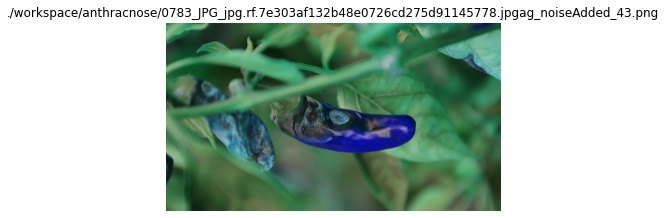

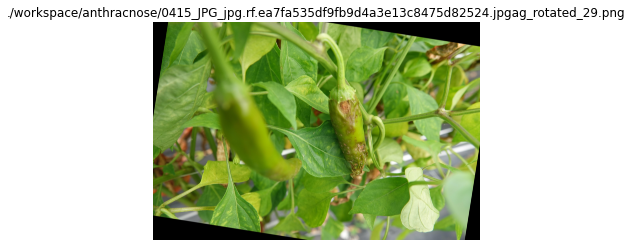

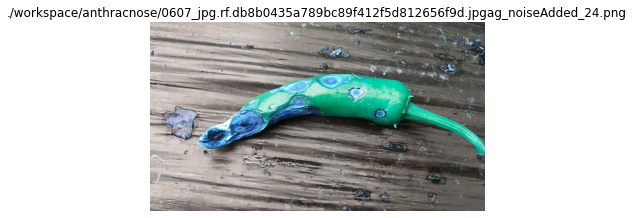

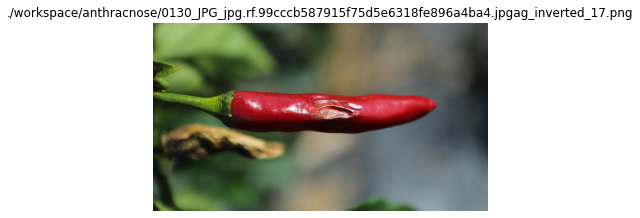

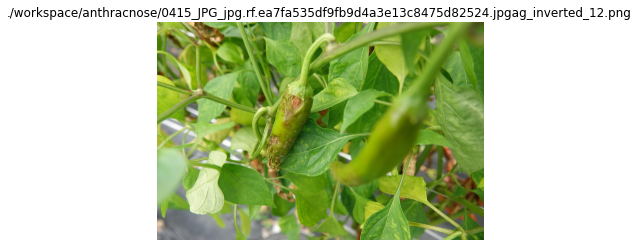

...

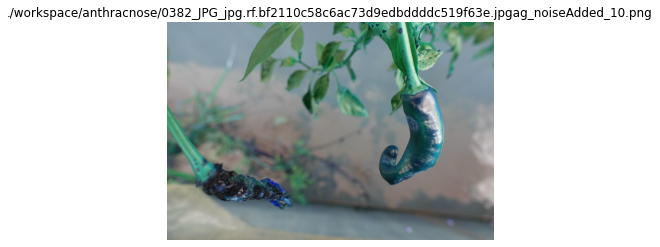

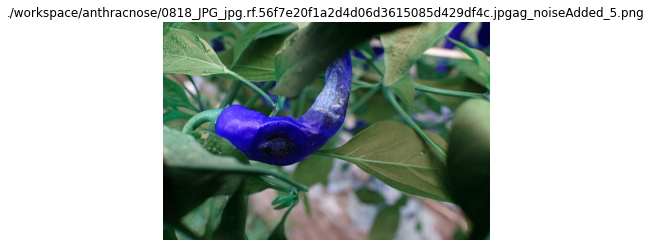

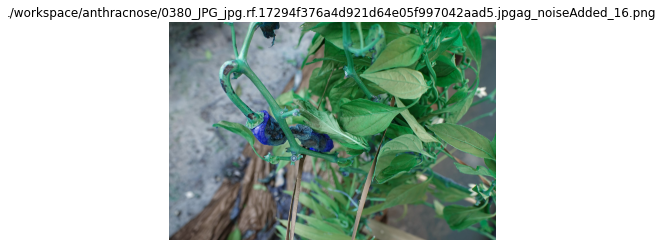

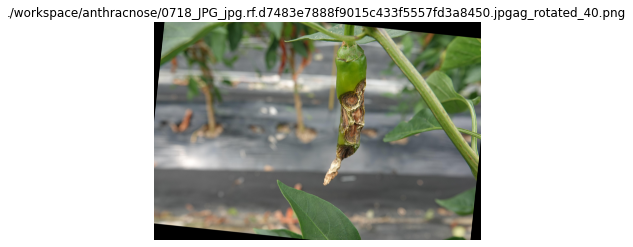

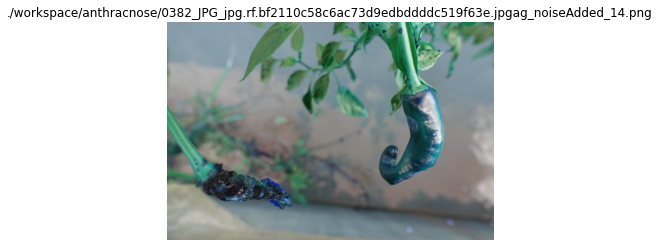

Exception ignored in: <function IteratorResourceDeleter.__del__ at 0x79e07f945320>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/tensorflow/python/data/ops/iterator_ops.py", line 546, in __del__
    handle=self._handle, deleter=self._deleter)
  File "/opt/conda/lib/python3.7/site-packages/tensorflow/python/ops/gen_dataset_ops.py", line 1264, in delete_iterator
    _ctx, "DeleteIterator", name, handle, deleter)
KeyboardInterrupt: 


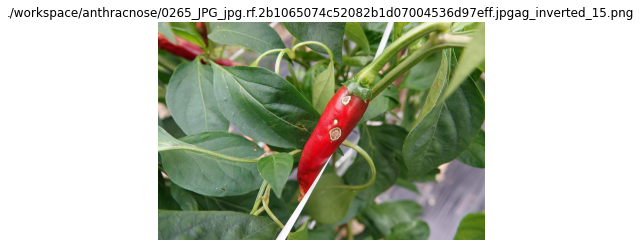

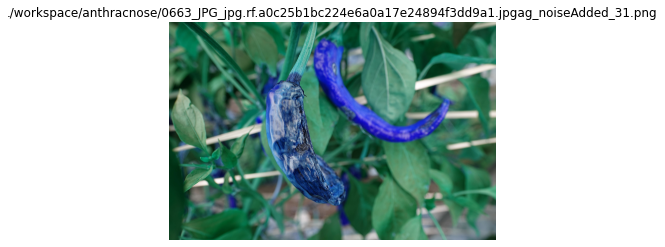

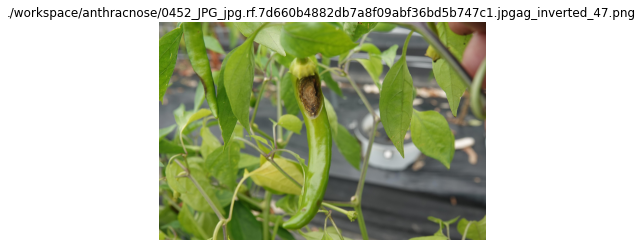

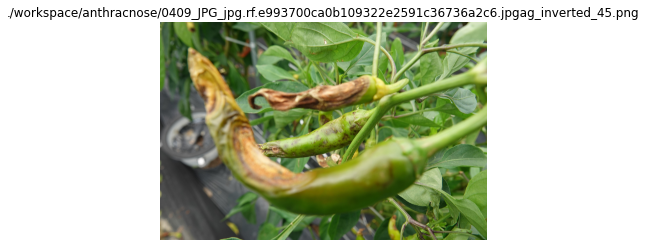

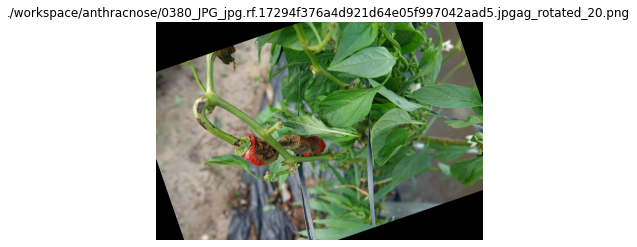

...

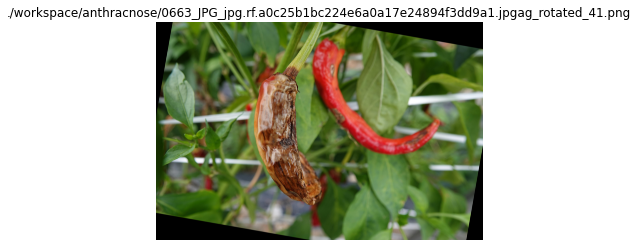

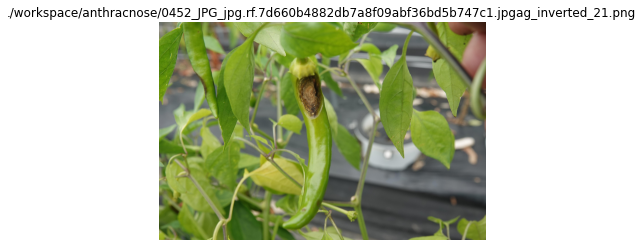

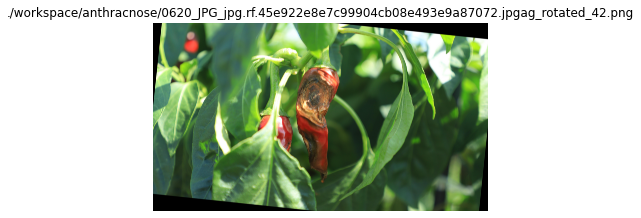

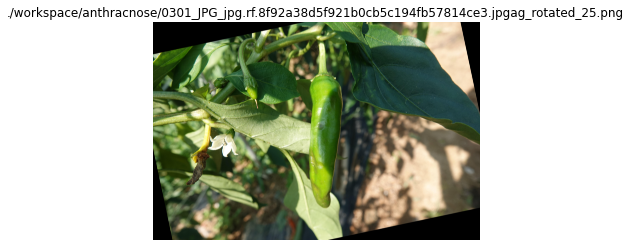

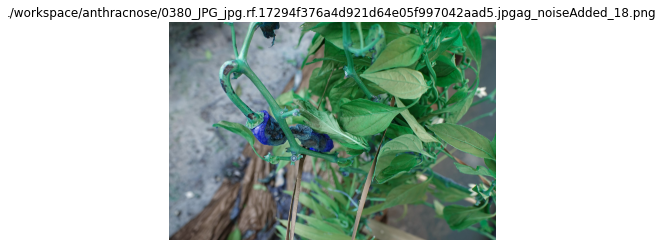

In [ ]:
#증강이미지 시각화
import glob

# Set the directory path of your dataset
dataset_dir = './workspace/'

# Define the search pattern to match file names
search_pattern = os.path.join(dataset_dir, '*/*ag_*.png')

# Use glob to retrieve the file names
matching_files = glob.glob(search_pattern)

# Print the matching file names
for file_name in matching_files:
    print(file_name)
for file_name in matching_files:
    # Open the image using PIL
    image = Image.open(file_name)
    
    
    # Display the image using Matplotlib
    plt.imshow(image)
    plt.title(file_name)
    plt.axis('off')
    plt.show()

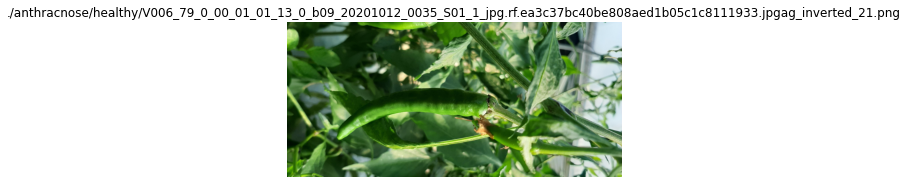

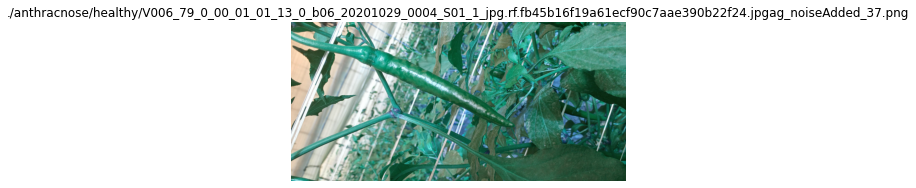

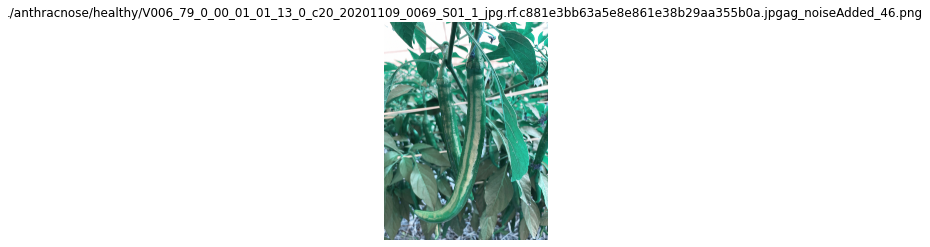

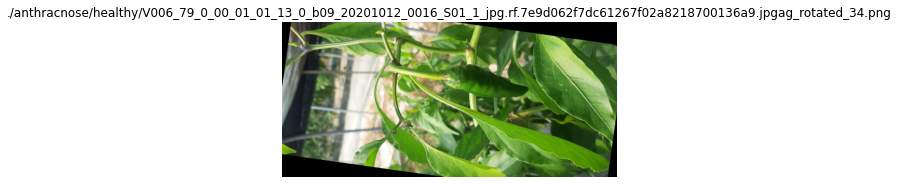

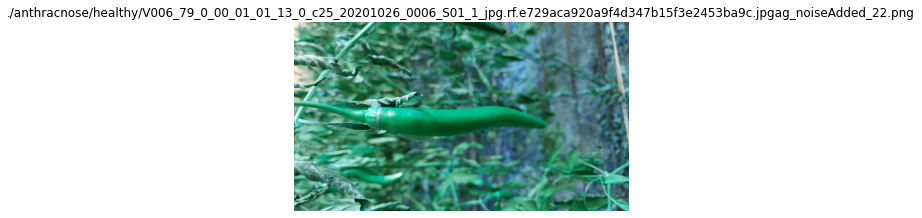

...

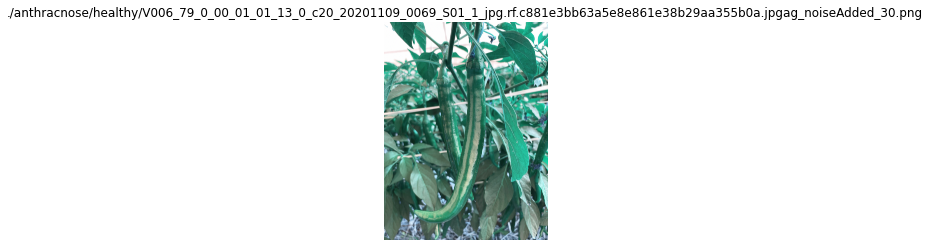

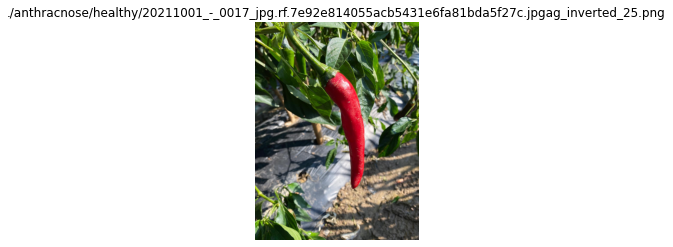

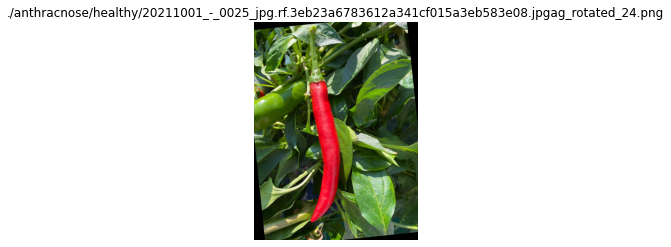

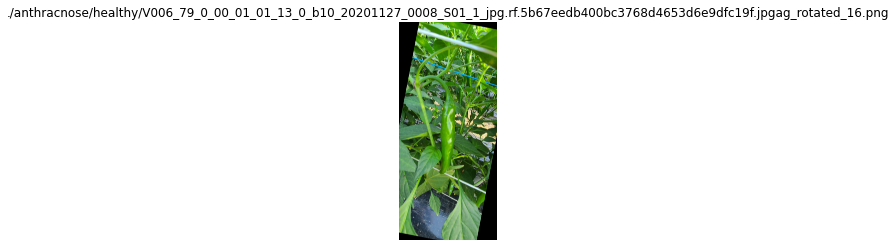

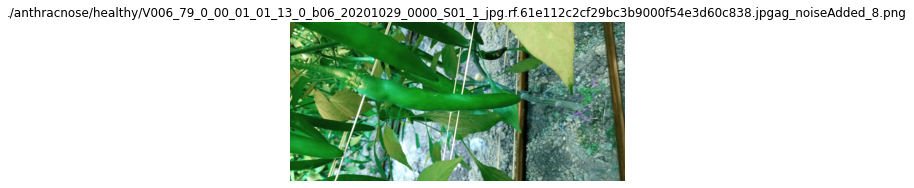

### **Data Visualization**

In [9]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...


KeyboardInterrupt: 

Cleanup called...


In [ ]:
plt.figure(figsize=(20,10))
for image_batch, label_batch in dataset.take(1):
    for i in range(15):
        ax = plt.subplot(3,5,i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

### **Train Test Split**

In [10]:
def get_dataset_partitions(ds,train_split=0.8,valid_split=0.2,shuffle=True,shuffle_size=10000):
    assert  train_split+valid_split==1
    ds_size = len(ds)
    if shuffle:
        ds.shuffle(shuffle_size,seed=12)
    train_size = int(len(ds)*train_split)
    valid_size = int(len(ds)*valid_split)

  
    train_ds = ds.take(train_size)    
    valid_ds = ds.skip(train_size).take(valid_size)

    return train_ds, valid_ds

In [11]:
def get_test_dataset_partitions(ds,shuffle=True,shuffle_size=10000):
    ds_size = len(ds)
    if shuffle:
        ds.shuffle(shuffle_size,seed=12)
    test_size = int(len(ds))
    test_ds = ds.take(test_size)    

    return test_ds


In [12]:
train_ds ,valid_ds = get_dataset_partitions(dataset)
test_ds = get_test_dataset_partitions(test_dataset)

In [13]:
print(len(train_ds))
print(len(valid_ds))
print(len(test_ds))

36
9
26


In [14]:
# performance improving by both using CPU and GPU
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
valid_ds = valid_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

### **Image Preprocessing**

In [15]:
rescale_and_resize=tf.keras.Sequential([
    #layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE) ,# will resize to the IMAGE_SIZE if there's any issue
    layers.CenterCrop(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1./255)  # Normalization
])

In [16]:
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    restore_best_weights=True,
    patience=5,
    min_delta=0.02
)

In [17]:
#data augmentation

data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

### **Building a Model**

In [18]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 2


model = models.Sequential([
    rescale_and_resize,
    #data_augmentation,
    
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [19]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (32, 512, 512, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (32, 510, 510, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (32, 255, 255, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (32, 253, 253, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (32, 126, 126, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (32, 124, 124, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (32, 62, 62, 64)         

In [20]:
from tensorflow.keras.optimizers import Adam
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=["accuracy"]
)

In [21]:
#model training
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=valid_ds,
    epochs=EPOCHS,
    verbose=1,
)

Epoch 1/100


Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup ca

36/36 [==============================] - ETA: 0s - loss: 0.6338 - accuracy: 0.6875

Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup ca

36/36 [==============================] - 293s 4s/step - loss: 0.6338 - accuracy: 0.6875 - val_loss: 0.5744 - val_accuracy: 0.8125
Epoch 2/100
36/36 [==============================] - 5s 130ms/step - loss: 0.4751 - accuracy: 0.8299 - val_loss: 0.2982 - val_accuracy: 0.8681
Epoch 3/100
36/36 [==============================] - 5s 132ms/step - loss: 0.3245 - accuracy: 0.8689 - val_loss: 0.1817 - val_accuracy: 0.9271
Epoch 4/100
36/36 [==============================] - 5s 130ms/step - loss: 0.1795 - accuracy: 0.9392 - val_loss: 0.1045 - val_accuracy: 0.9583
Epoch 5/100
36/36 [==============================] - 5s 129ms/step - loss: 0.1246 - accuracy: 0.9575 - val_loss: 0.1218 - val_accuracy: 0.9514
Epoch 6/100
36/36 [==============================] - 5s 129ms/step - loss: 0.1466 - accuracy: 0.9505 - val_loss: 0.1434 - val_accuracy: 0.9479
Epoch 7/100
36/36 [==============================] - 5s 129ms/step - loss: 0.1172 - accuracy: 0.9592 - val_loss: 0.3290 - val_accuracy: 0.8924
Epoch 8/100


In [22]:
scores = model.evaluate(test_ds)

scores

26/26 [==============================] - 57s 62ms/step - loss: 2.2487 - accuracy: 0.7310


[2.2487306594848633, 0.7309582233428955]

### **Plotting Model Accuracy**

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
# acc = tuple(sorted(acc))
# val_acc = tuple(sorted(val_acc))
loss = history.history['loss']
val_loss = history.history['val_loss']
# loss = tuple(sorted(loss,reverse=True))
# val_loss = tuple(sorted(val_loss,reverse=True))

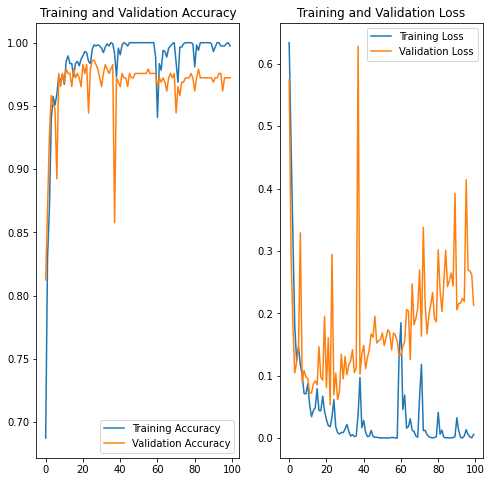

In [24]:
EPOCHS=100
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()



Confusion Matrix

### **Running prediction on a sample image**

### **Predictions**

In [59]:
def predict_pepper_bell_diseases(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)
  

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Assuming you have the ground truth labels and predicted labels
ground_truth = [0, 1, 2, 0, 1, 2, 0, 1, 2]  # Ground truth labels for your images
predicted_labels = list(predictions)  # Predicted labels from your CNN model

# Create the confusion matrix
cm = confusion_matrix(ground_truth, predicted_labels)

# Plot the confusion matrix
classes = ['Class 0', 'Class 1', 'Class 2']  # Replace with your actual class labels
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

# Add labels to each cell in the confusion matrix
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()


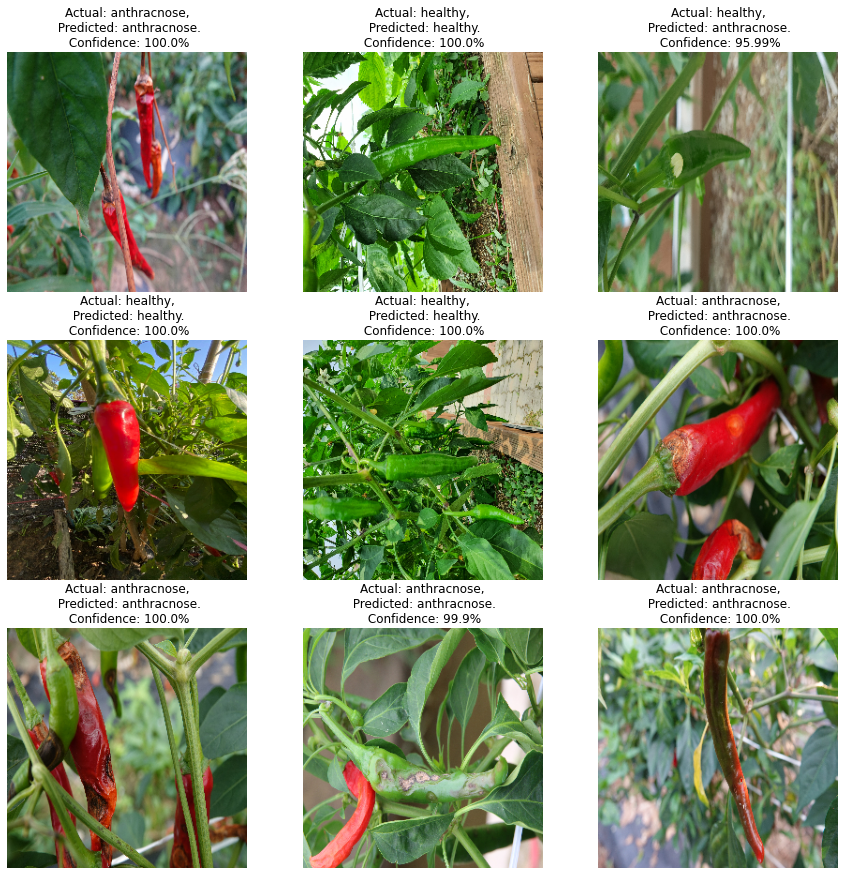

In [60]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict_pepper_bell_diseases(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

### **Saving the Model**

In [ ]:
!mkdir models
import os
model_version=max([int(i) for i in os.listdir("models") + [0]])+1
model.save(f"models/bell_pepper_{model_version}")

In [ ]:
model.save("anth_CNN.h5")

In [ ]:
os.chdir(r'/kaggle/working')

from IPython.display import FileLink
FileLink(r'anth_CNN.h5')

#### **THE END :)**